## ISP Lab08-Image Processing and Analysis
## University of Science in Math & Computer Faculty
## Nguyen Quoc Bao 18110053

In [1]:
import numpy as np 
import pandas as pd
import math
import cv2 
from matplotlib import pyplot as plt 
import matplotlib.cm as cm
import matplotlib.gridspec as gridspec
from pylab import imread
from skimage.color import rgb2gray

In [2]:
def ShowImage(ImageList, nRows = 1, nCols = 2, WidthSpace = 0.00, HeightSpace = 0.00):
    from matplotlib import pyplot as plt 
    import matplotlib.gridspec as gridspec
    
    gs = gridspec.GridSpec(nRows, nCols)     
    gs.update(wspace=WidthSpace, hspace=HeightSpace) # set the spacing between axes.
    plt.figure(figsize=(20,10))
    for i in range(len(ImageList)):
        ax1 = plt.subplot(gs[i])
        ax1.set_xticklabels([])
        ax1.set_yticklabels([])
        ax1.set_aspect('equal')

        plt.subplot(nRows, nCols,i+1)

        image = ImageList[i].copy()
        if (len(image.shape) < 3):
            plt.imshow(image, plt.cm.gray)
        else:
            plt.imshow(image)
        plt.title("Image " + str(i))
        plt.axis('off')

    plt.show()

In [3]:
def InfoImage(IM):
    Image = IM
    Width = Image.shape[1]
    Height = Image.shape[0]
    Channel = len(Image.shape)
    print("Width : ", Width, " Height : ", Height, " Channel : ", Channel)
    
    if(Channel == 2):
        print("Min Intensity: ", IM.min(), " Max Intensity: ", IM.max())
    else:
        print("Red - Min Intensity: ", IM[:,:,0].min(), " Max Intensity: ", IM[:,:,0].max())
        print("Green - Min Intensity: ", IM[:,:,1].min(), " Max Intensity: ", IM[:,:,1].max())
        print("Blue - Min Intensity: ", IM[:,:,2].min(), " Max Intensity: ", IM[:,:,2].max()) 

In [4]:
def ResizeImage(IM, DesiredWidth, DesiredHeight):
    from skimage.transform import rescale, resize
    
    OrigWidth = float(IM.shape[1])
    OrigHeight = float(IM.shape[0])
    Width = DesiredWidth 
    Height = DesiredHeight

    if((Width == 0) & (Height == 0)):
        return IM
    
    if(Width == 0):
        Width = int((OrigWidth * Height)/OrigHeight)

    if(Height == 0):
        Height = int((OrigHeight * Width)/OrigWidth)

    dim = (Width, Height)
#     print(dim)
    resizedIM = cv2.resize(IM, dim, interpolation = cv2.INTER_NEAREST) 
#     imshows([IM, resizedIM], ["Image", "resizedIM"],1,2)
    return resizedIM

### 1/ Kiếm 1 ảnh từ internet thực hiện các thao tác biến đổi sau bằng cách gọi hàm từ các thư viện (opencv hay skimage hay bất kỳ thư viện nào)
- Scaling
- Rotation (30, 45, 60, 90, 120, 160, 180)
- Translation
- Shearing

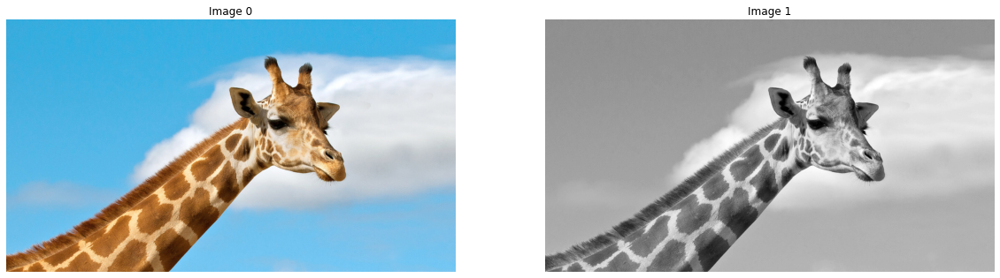

In [5]:
# Read Image 
image_color = imread("Sample08/giraffe.jpg")
# Convert Image into Gray
image_gray = cv2.cvtColor(image_color, cv2.COLOR_RGB2GRAY)

# Display Image
ShowImage([image_color, image_gray], 1, 2)


 image_color :
Width :  1920  Height :  1080  Channel :  3
Red - Min Intensity:  0  Max Intensity:  255
Green - Min Intensity:  0  Max Intensity:  255
Blue - Min Intensity:  0  Max Intensity:  255

 image_scale01 :
Width :  960  Height :  1080  Channel :  3
Red - Min Intensity:  0  Max Intensity:  255
Green - Min Intensity:  0  Max Intensity:  255
Blue - Min Intensity:  0  Max Intensity:  255

 image_scale02 :
Width :  960  Height :  540  Channel :  3
Red - Min Intensity:  0  Max Intensity:  255
Green - Min Intensity:  0  Max Intensity:  255
Blue - Min Intensity:  0  Max Intensity:  255

 image_scale03 :
Width :  1920  Height :  540  Channel :  3
Red - Min Intensity:  0  Max Intensity:  255
Green - Min Intensity:  0  Max Intensity:  255
Blue - Min Intensity:  0  Max Intensity:  255


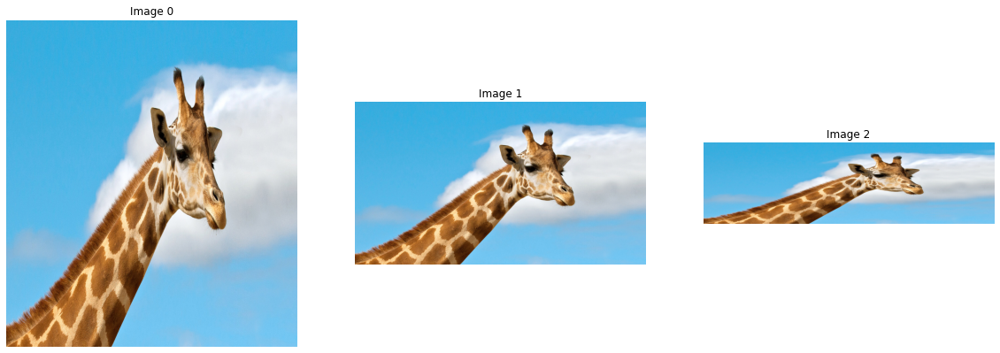

In [6]:
# Scaling
image_scale01 = cv2.resize(image_color,None,fx=0.5, fy=1, interpolation = cv2.INTER_CUBIC)
image_scale02 = cv2.resize(image_color,None,fx=0.5, fy=0.5, interpolation = cv2.INTER_CUBIC)
image_scale03 = cv2.resize(image_color,None,fx=1, fy=0.5, interpolation = cv2.INTER_CUBIC)
print("\n image_color :")
InfoImage(image_color)
print("\n image_scale01 :")
InfoImage(image_scale01)
print("\n image_scale02 :")
InfoImage(image_scale02)
print("\n image_scale03 :")
InfoImage(image_scale03)

ShowImage([image_scale01, image_scale02, image_scale03], 1, 3)

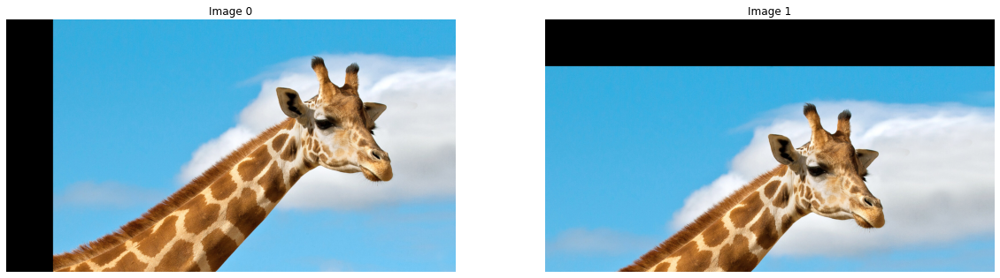

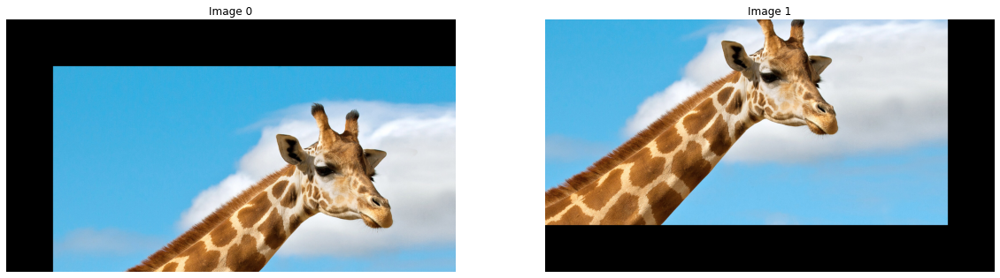

In [7]:
# Translation
rows,cols = image_color.shape[:2]
TranslationMatrix = np.float32([[1,0,200],[0,1,0]])
image_translation01 = cv2.warpAffine(image_color,TranslationMatrix,(cols,rows))
TranslationMatrix = np.float32([[1,0,0],[0,1,200]])
image_translation02 = cv2.warpAffine(image_color,TranslationMatrix,(cols,rows))
TranslationMatrix = np.float32([[1,0,200],[0,1,200]])
image_translation03 = cv2.warpAffine(image_color,TranslationMatrix,(cols,rows))
TranslationMatrix = np.float32([[1,0,-200],[0,1,-200]])
image_translation04 = cv2.warpAffine(image_color,TranslationMatrix,(cols,rows))

ShowImage([image_translation01, image_translation02], 1, 2)
ShowImage([image_translation03, image_translation04], 1, 2)

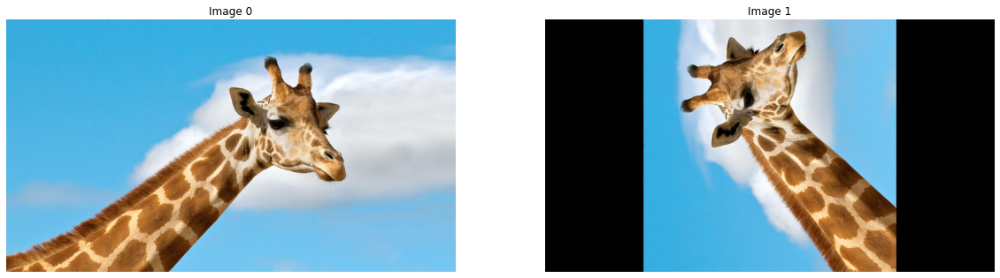

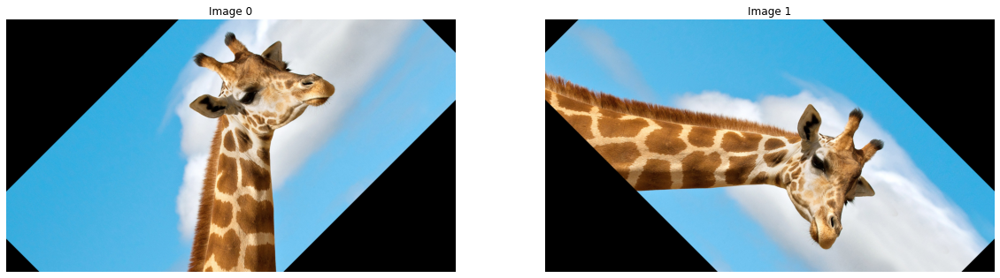

In [8]:
# Rotation
rows,cols  = image_color.shape[:2]
RotationMatrix = cv2.getRotationMatrix2D((cols/2,rows/2),90,1)
image_rotation01 = cv2.warpAffine(image_color,RotationMatrix,(cols,rows))

RotationMatrix = cv2.getRotationMatrix2D((cols/2,rows/2),45,1)
image_rotation02 = cv2.warpAffine(image_color,RotationMatrix,(cols,rows))

RotationMatrix = cv2.getRotationMatrix2D((cols/2,rows/2),-45,1)
image_rotation03 = cv2.warpAffine(image_color,RotationMatrix,(cols,rows))


ShowImage([image_color, image_rotation01], 1, 2)
ShowImage([image_rotation02, image_rotation03], 1, 2)

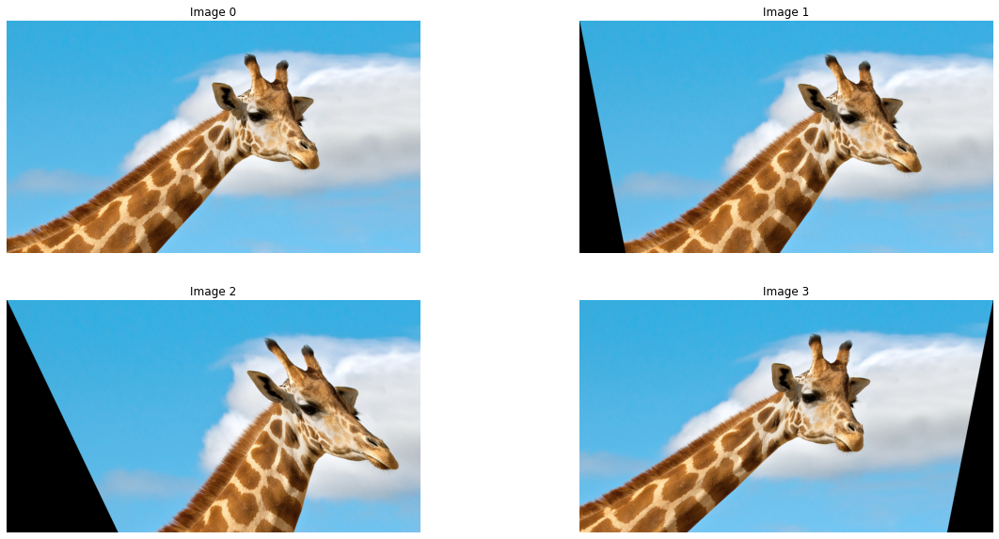

In [9]:
# Shearing
from skimage import transform as tf

# Create Afine transform
afine_tf = tf.AffineTransform(shear=0.2)
image_shear01 = tf.warp(image_color, inverse_map=afine_tf)

afine_tf = tf.AffineTransform(shear=0.5)
image_shear02 = tf.warp(image_color, inverse_map=afine_tf)

afine_tf = tf.AffineTransform(shear=-0.2)
image_shear03 = tf.warp(image_color, inverse_map=afine_tf)

ShowImage([image_color, image_shear01, image_shear02, image_shear03], 2, 2)

### 2/ Kiếm 1 ảnh từ internet thực hiện các thao tác biến đổi sau bằng cách nhân thông qua ma trận biến đổi
- Scaling
- Rotation (30, 45, 60, 90, 120, 160, 180)
- Translation
- Shearing

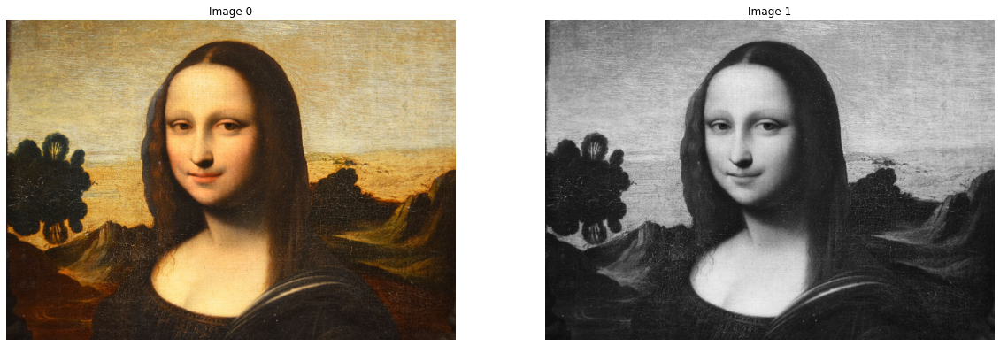

In [10]:
# Read Image 
image_color = imread("Sample08/monalisa.jpg")
# Convert Image into Gray
image_gray = cv2.cvtColor(image_color, cv2.COLOR_RGB2GRAY)

# Display Image
ShowImage([image_color, image_gray], 1, 2)

In [11]:

def Translate(image, shift_distance):
    n,m = image.shape[:2]
    dx = shift_distance[0]
    dy = shift_distance[1]
    scan = np.array([[1,0,dx],[0,1,dy]])
    out_img = np.zeros(image.shape,dtype='u1')
    for i in range(n):
        for j in range(m):
            origin_x = j
            origin_y = i
            origin_xy = np.array([origin_x,origin_y,1])

            new_xy = np.dot(scan,origin_xy)
            new_x = new_xy[0]
            new_y = new_xy[1]

            if 0 < new_x < m and 0 < new_y < n:
                out_img[new_y,new_x] = image[i,j]
    return out_img


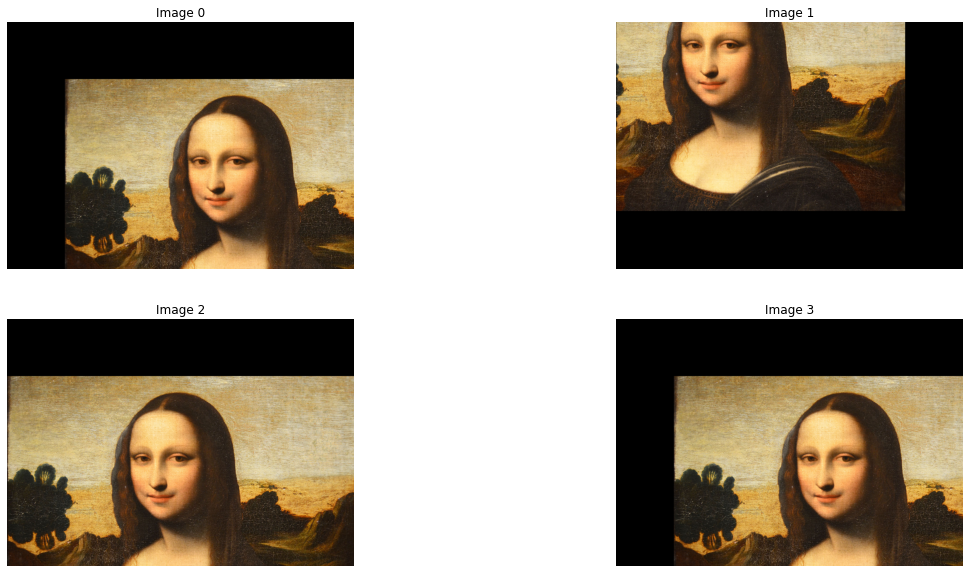

In [12]:
shift_distance1 = (300,300)
shift_img1 = Translate(image_color, shift_distance1)
shift_distance2 = (-300,-300)
shift_img2 = Translate(image_color, shift_distance2)
shift_distance3 = (0,300)
shift_img3 = Translate(image_color, shift_distance3)
shift_distance4 = (300,300)
shift_img4 = Translate(image_color, shift_distance4)
ShowImage([shift_img1,shift_img2,shift_img3,shift_img4],2,2)

In [13]:
def resize(img, sx, sy):
    height, width = img.shape[:2]; 

  
    New_width = int(width * sx)
    New_height = int(height * sy) 

#     xScale = New_width/(width-1) 
#     yScale = New_height/(height-1) 

    scale = np.array([[sy,0,0],[0,sx,0],[0,0,1]])
    newImage = np.zeros((New_height, New_width, 3), dtype = "u1")
    for i in range(height-1): 
        for j in range(width-1):
#             newImage[i+1, j+1]= img[1 + int(i / yScale), 1 + int(j / xScale)]
            original_xy = np.array([i,j,1])
            new_xy = np.dot(scale,original_xy)
            new_x = new_xy[1].astype(int)
            new_y = new_xy[0].astype(int)
            if 0 <= new_x < width and 0 <= new_y < height:
                newImage[new_y,new_x] = img[i,j]
    return newImage


 image_color :
Width :  1800  Height :  1282  Channel :  3
Red - Min Intensity:  11  Max Intensity:  255
Green - Min Intensity:  0  Max Intensity:  255
Blue - Min Intensity:  0  Max Intensity:  243

 image_scale01 :
Width :  900  Height :  1282  Channel :  3
Red - Min Intensity:  0  Max Intensity:  255
Green - Min Intensity:  0  Max Intensity:  252
Blue - Min Intensity:  0  Max Intensity:  243

 image_scale02 :
Width :  900  Height :  641  Channel :  3
Red - Min Intensity:  14  Max Intensity:  255
Green - Min Intensity:  0  Max Intensity:  250
Blue - Min Intensity:  0  Max Intensity:  232

 image_scale03 :
Width :  1800  Height :  641  Channel :  3
Red - Min Intensity:  0  Max Intensity:  255
Green - Min Intensity:  0  Max Intensity:  255
Blue - Min Intensity:  0  Max Intensity:  234


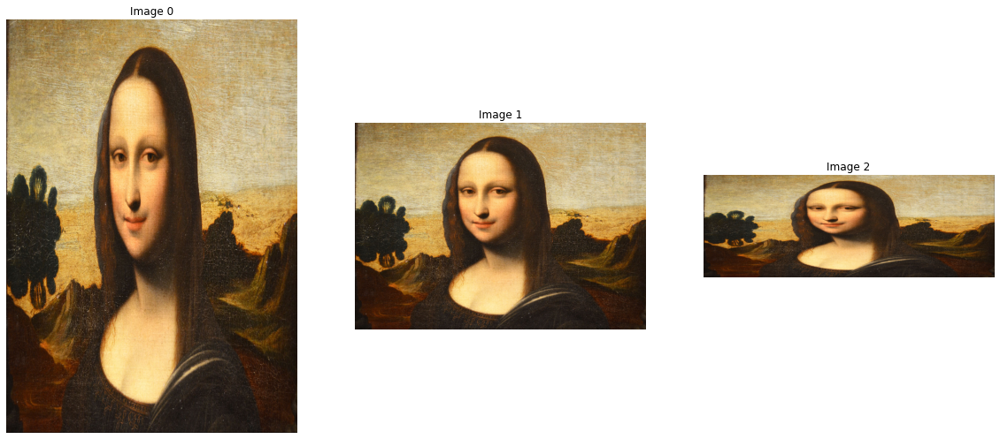

In [14]:
# image_scale01 = cv2.resize(image_color,None,fx=0.5, fy=1, interpolation = cv2.INTER_CUBIC)
# image_scale02 = cv2.resize(image_color,None,fx=0.5, fy=0.5, interpolation = cv2.INTER_CUBIC)
# image_scale03 = cv2.resize(image_color,None,fx=1, fy=0.5, interpolation = cv2.INTER_CUBIC)

image_scale01 = resize(image_color,0.5,1)
image_scale02 = resize(image_color,0.5,0.5)
image_scale03 = resize(image_color,1,0.5)

print("\n image_color :")
InfoImage(image_color)
print("\n image_scale01 :")
InfoImage(image_scale01)
print("\n image_scale02 :")
InfoImage(image_scale02)
print("\n image_scale03 :")
InfoImage(image_scale03)

ShowImage([image_scale01, image_scale02, image_scale03], 1, 3)


In [15]:
#get rotation matrix
def getRMat(cx, cy, angle, scale):
    a = scale*math.cos(angle*np.pi/180)
    b = scale*(math.sin(angle*np.pi/180))
    u = (1-a)*cx-b*cy
    v = b*cx+(1-a)*cy
    return np.array([[a,b,u], [-b,a,v]])

def rotation(image, angleInDegrees,scale=1):
    height, width = image.shape[:2]
    center_x, center_y = (width // 2, height // 2)

#     rot = cv2.getRotationMatrix2D(img_centre, angleInDegrees, 1)
    mat = getRMat(center_x,center_y, -int(angleInDegrees), scale)
    
    cos = np.abs(mat[0,0])
    sin = np.abs(mat[0,1])
    new_width = int((height * sin) + (width * cos))
    new_height = int((height * cos) + (width * sin))

    mat[0, 2] += ((new_width / 2) - center_x)
    mat[1, 2] += ((new_height / 2) - center_y)
    outImg = cv2.warpAffine(image, mat, (new_width, new_height), flags=cv2.INTER_LINEAR)
    return outImg

Width :  2179  Height :  2179  Channel :  3
Red - Min Intensity:  0  Max Intensity:  255
Green - Min Intensity:  0  Max Intensity:  244
Blue - Min Intensity:  0  Max Intensity:  224
Width :  1282  Height :  1800  Channel :  3
Red - Min Intensity:  0  Max Intensity:  255
Green - Min Intensity:  0  Max Intensity:  255
Blue - Min Intensity:  0  Max Intensity:  243


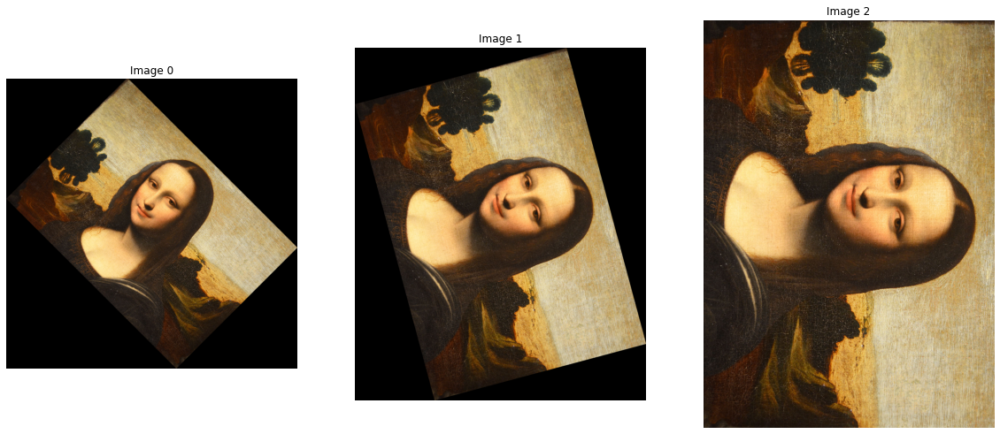

In [16]:
image_rotation01 = rotation(image_color,45)
image_rotation02 = rotation(image_color,75)
image_rotation03 = rotation(image_color,90)
InfoImage(image_rotation01)
InfoImage(image_rotation03)
ShowImage([image_rotation01,image_rotation02,image_rotation03],1,3)

In [17]:
def Shearing(image, sh, axis):
    if axis == 1:
        shear = np.array([[1,sh,0],[0,1,0],[0,0,1]])
    elif axis == 0:
        shear = np.array([[1,0,0],[sh,1,0],[0,0,1]])
    height, width = image.shape[:2]
    out_img = np.zeros((height,width,image.shape[2]), dtype=np.uint8)
    for i in range(height):
        for j in range(width):
            origin_xy = [i,j,1]
            new_xy = np.dot(shear,origin_xy)
            new_x = new_xy[1].astype(int)
            new_y = new_xy[0].astype(int)
            if 0 <= new_x < width and 0 <= new_y < height:
                out_img[i,j] = image[new_y,new_x]
    return out_img

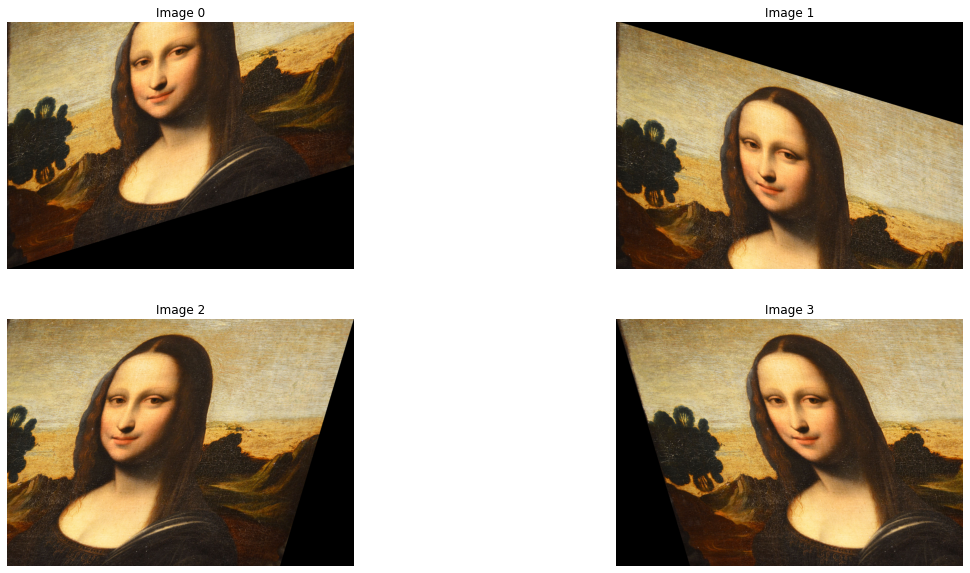

In [18]:
shearing1 = Shearing(image_color,0.3,1)
shearing2 = Shearing(image_color,-0.3,1)
shearing3 = Shearing(image_color,0.3,0)
shearing4 = Shearing(image_color,-0.3,0)
ShowImage([shearing1,shearing2,shearing3,shearing4],2,2)

### 3/ Cũng thực hiện nhân ma trận. Tạo các ma trận tổng hợp sau:
- Scaling + Rotation
- Rotation + Shearing
- Scaling + Rotation + Shearing

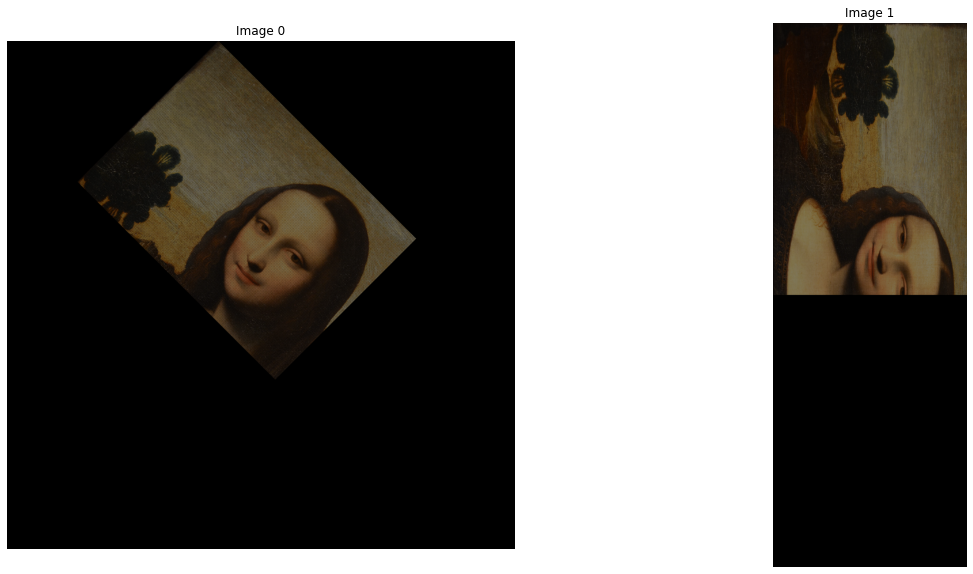

In [19]:
# scaling + rotation
new_image1 = rotation(resize(image_color,1.5,1.5),45)
new_image2 = rotation(resize(image_color,2,1),90)
ShowImage([new_image1,new_image2],1,2)

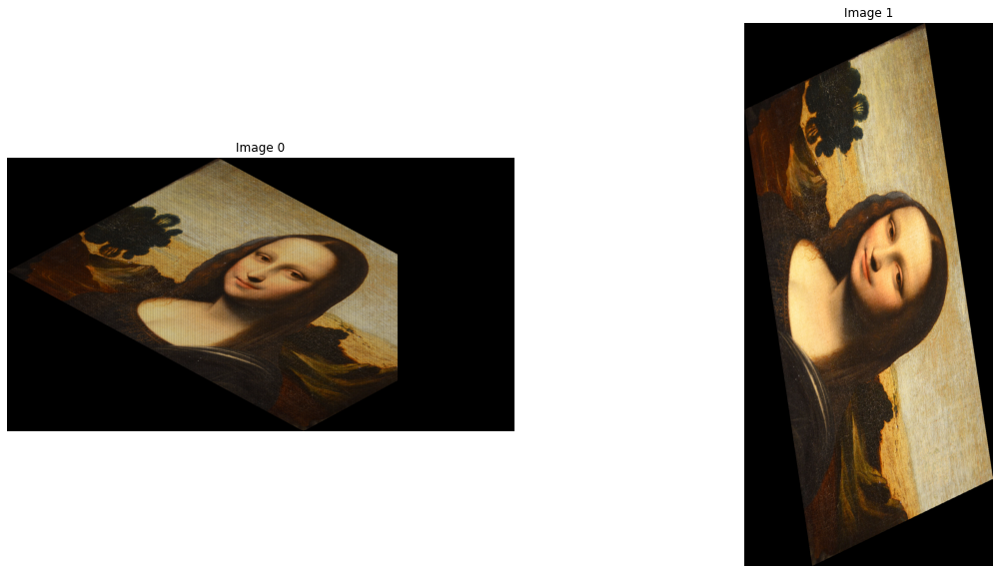

In [20]:
img1 = resize(rotation(image_color,45),1.3,0.7)
img2 = resize(rotation(image_color,75),0.5,0.9)
ShowImage([img1,img2],1,2)

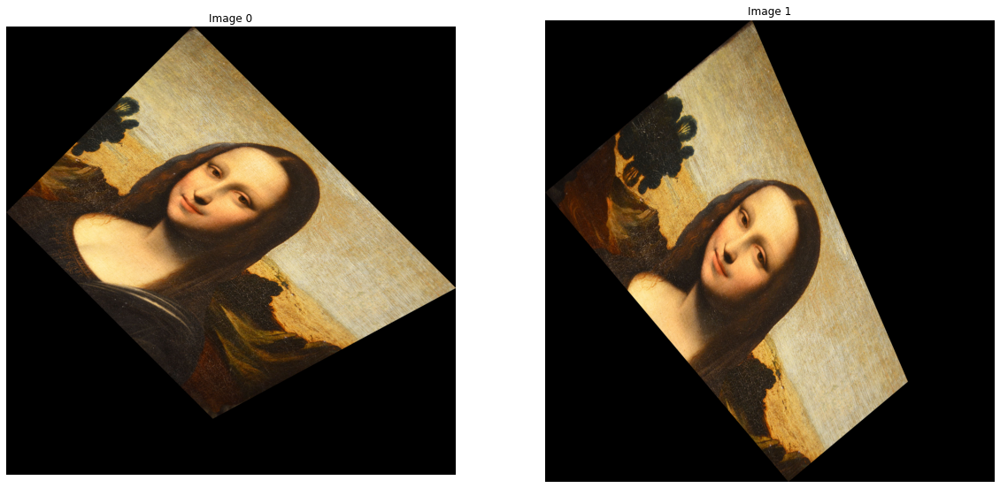

In [21]:
# rotation + shearing
new_image1 = rotation(Shearing(image_color,0.3,0),45)
new_image2 = rotation(Shearing(image_color,-0.3,1),50)
ShowImage([new_image1,new_image2],1,2)

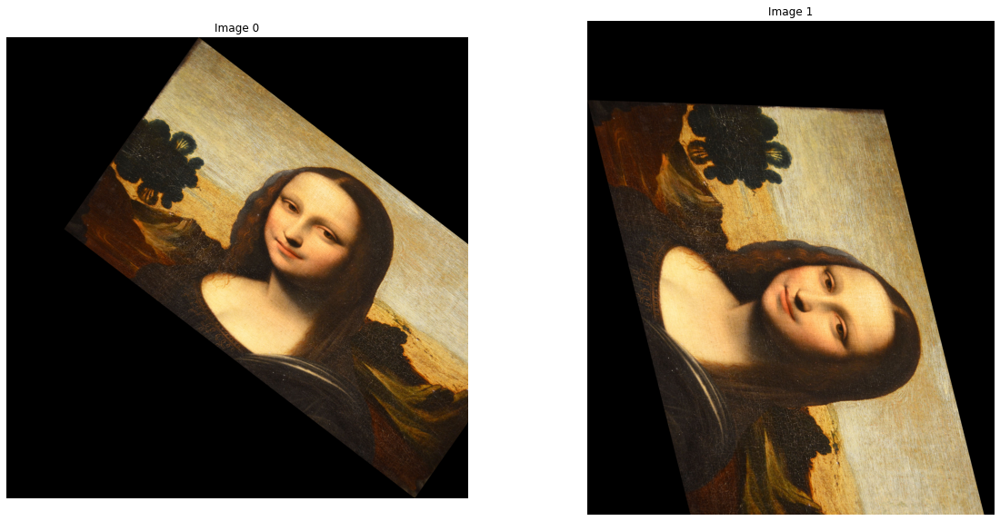

In [22]:
new_image1 = Shearing(rotation(image_color,45),-0.3,0)
new_image2 = Shearing(rotation(image_color,75),-0.3,1)
ShowImage([new_image1,new_image2],1,2)

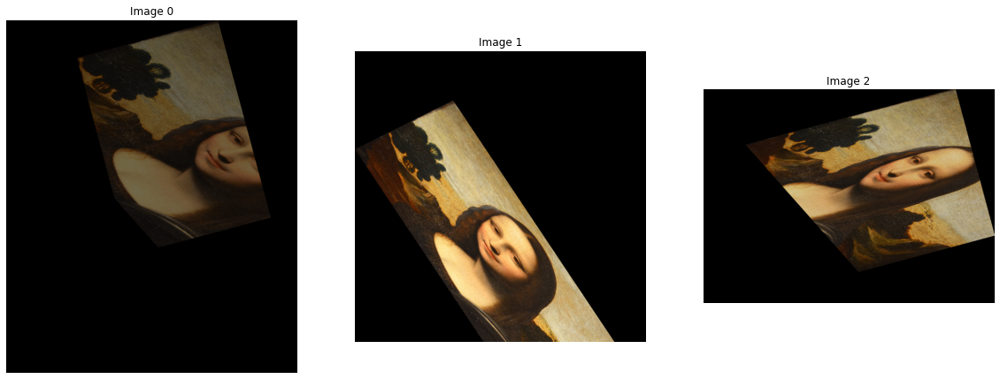

In [23]:
# scaling + rotation + shearing
new_image1 = rotation(resize(Shearing(image_color,0.5,1),1.5,1.5),75)
new_image2 = Shearing(rotation(resize(image_color,0.7,0.5),45),-0.5,1)
new_image3 = rotation(Shearing(resize(image_color,0.5,1.2),0.5,1),75)
ShowImage([new_image1,new_image2,new_image3],1,3)

### 4/ Chụp một tấm ảnh bất kỳ từ điện thoại của bạn có chứa vật thể dạng hình chữ nhật hay hình vuông (ví dụ bức tranh, điện thoại, màn hình máy tính v.v…) (Lưu ý chụp nghiêng, xéo và không được chụp thẳng)
- Xác định 4 điểm góc của đối tượng bằng tay và vẽ chúng lên hình
- Dùng biến đổi Affine hoặc Perspective để canh chỉnh chúng thẳng

Width :  500  Height :  800  Channel :  3
Red - Min Intensity:  0.0  Max Intensity:  0.61960787
Green - Min Intensity:  0.0  Max Intensity:  0.53333336
Blue - Min Intensity:  0.0  Max Intensity:  0.48235294


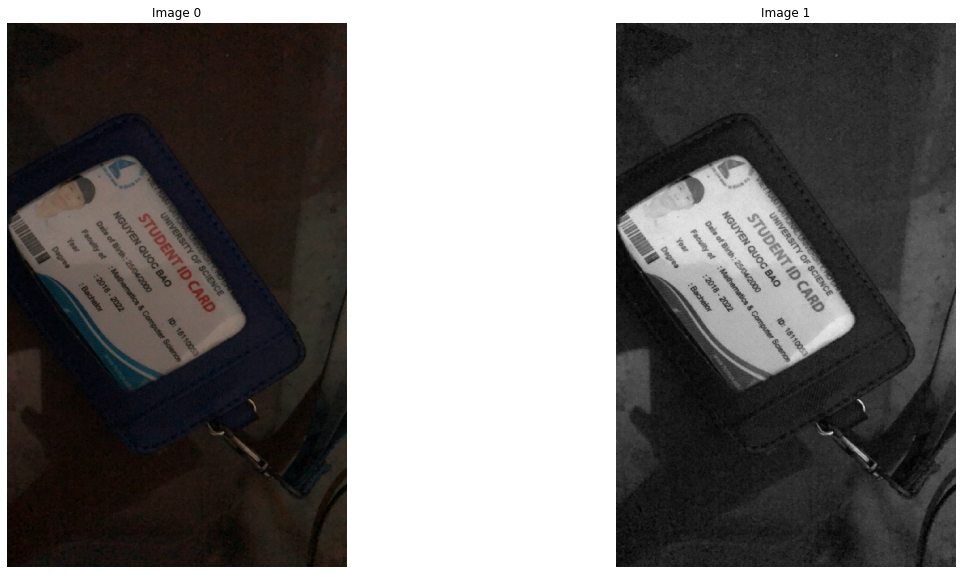

In [24]:
# Read Image 
image_color = imread("Sample08/My_ID.png")
image_color = ResizeImage(image_color, 500, 800)
# Convert Image into Gray
image_gray = cv2.cvtColor(image_color, cv2.COLOR_RGB2GRAY)

# Display Image
InfoImage(image_color)
ShowImage([image_color, image_gray], 1, 2)

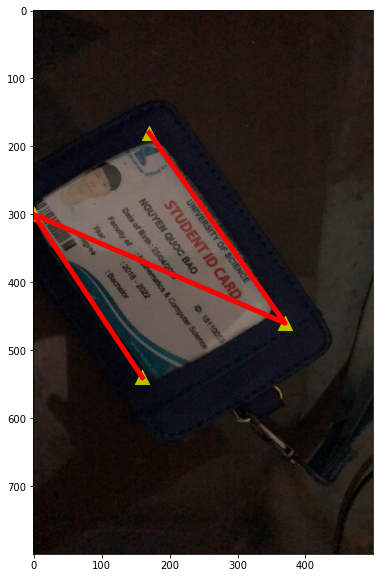

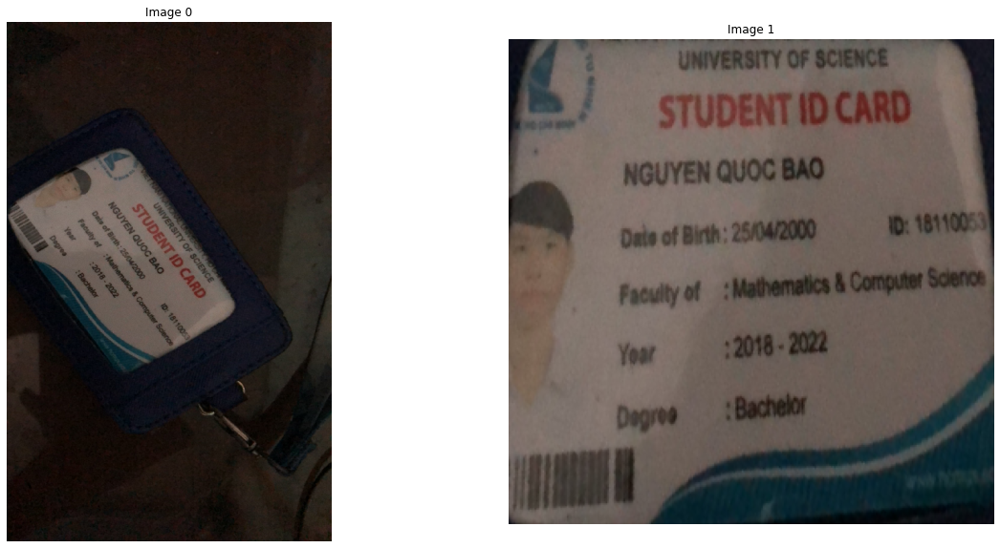

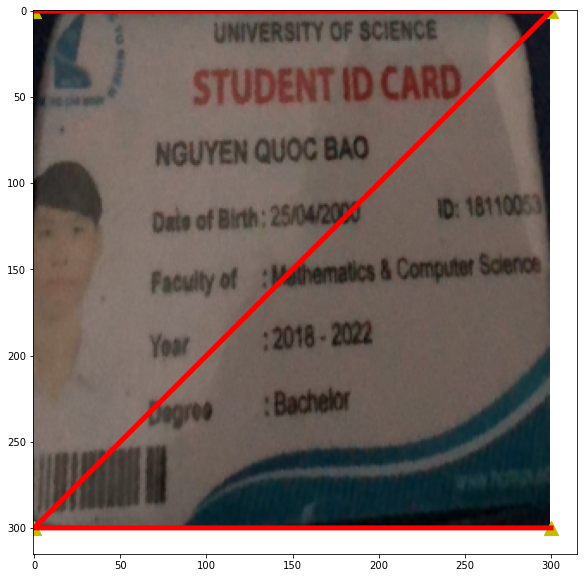

In [25]:
rows,cols,ch = image_color.shape

PointList_From = [[170,180],[370,460],[0,300],[160,540]]
PointList_To = [[0,0],[300,0],[0,300],[300,300]]

XList = []
YList = []

for pt in PointList_From:
    XList.append(pt[0])
    YList.append(pt[1])
    
plt.figure(figsize=(10,10))
plt.imshow(image_color)

plt.scatter(XList, YList, c='y', s=200, marker='^')
plt.plot(XList,YList,'r', linewidth=5, markersize=12)

plt.show()


pts1 = np.float32(PointList_From)
pts2 = np.float32(PointList_To)
MappingMatrix = cv2.getPerspectiveTransform(pts1,pts2)
image_Perspective = cv2.warpPerspective(image_color,MappingMatrix,(300,300))
ShowImage([image_color, image_Perspective], 1, 2)

XList = []
YList = []

for pt in PointList_To:
    XList.append(pt[0])
    YList.append(pt[1])
    
plt.figure(figsize=(10,10))
plt.imshow(image_Perspective)

plt.scatter(XList, YList, c='y', s=200, marker='^')
plt.plot(XList,YList,'r', linewidth=5, markersize=12)

plt.show()